In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy.visualization import simple_norm
from astropy import wcs
from astropy import table
from astropy.io import fits
from astropy import units as u
import PIL
import regions
import pyavm
import numpy as np
import pylab as pl
pl.rcParams['figure.facecolor'] = 'w'
pl.rcParams['image.origin'] = 'lower'
pl.rcParams['figure.figsize'] = (10,8)
pl.rcParams['figure.dpi'] = 100
pl.rcParams['font.size'] = 16

In [2]:
from astropy.io import fits
import reproject
from astropy import convolution
from astropy.convolution import Gaussian2DKernel
from astropy import units as u
from astropy.table import Table
import pyavm
import shutil

In [3]:
import regions
from astropy import coordinates

In [4]:
import PIL

In [5]:
from spectral_cube import SpectralCube, Projection, Slice

In [6]:
import uvcombine
from astropy import wcs

In [7]:
import scipy.ndimage

In [8]:
import matplotlib
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb

In [9]:
import numpy as np

In [10]:
import pylab as pl
from astropy.visualization import simple_norm

In [11]:
from astroquery.vizier import Vizier

In [12]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [13]:
import sys, imp
sys.path.append(f'{basepath}/analysis/')
sys.path.append(f'{basepath}/reduction/')
import plot_tools
imp.reload(plot_tools)
from plot_tools import starzoom, make_sed

/orange/adamginsburg/jwst/brick//reduction/filtering.py:20: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [14]:
from plot_tools import starzoom, make_sed

In [15]:
tgtlist = Table.read(f'{basepath}/regions/Prioritized_List_for_MPT_trimmed.txt', format='ascii', header_start=0, data_start=1)
tgtcrds = SkyCoord(tgtlist['ra']*u.deg, tgtlist['dec']*u.deg, frame='icrs')
tgtlist[:2]

name,ra,dec,glon,glat,rel_flag,ch1_id,ch1_mag,ch1_err,ch1_back,ch1_snr,ch1_cov,ch1_mnr,ch1_flag,priority
int64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,int64,int64
614958,266.5528,-28.744452,0.2310569,-0.01069722,0,435423,11.017,0.014,15.1,41.5,5,1.0,1,5
612716,266.54935,-28.750431,0.22437237,-0.01121499,1,433902,11.037,0.015,17.0,28.8,5,1.0,1,5


In [16]:
basetable = Table.read(f'{basepath}/catalogs/crowdsource_nsky0_merged_photometry_tables_merged.fits')
skycrd = basetable['skycoord_f410m']

In [17]:
seltgts = tgtcrds[tgtlist['priority'] == 20]
seltbl = tgtlist[tgtlist['priority'] == 20]
len(seltgts)

361

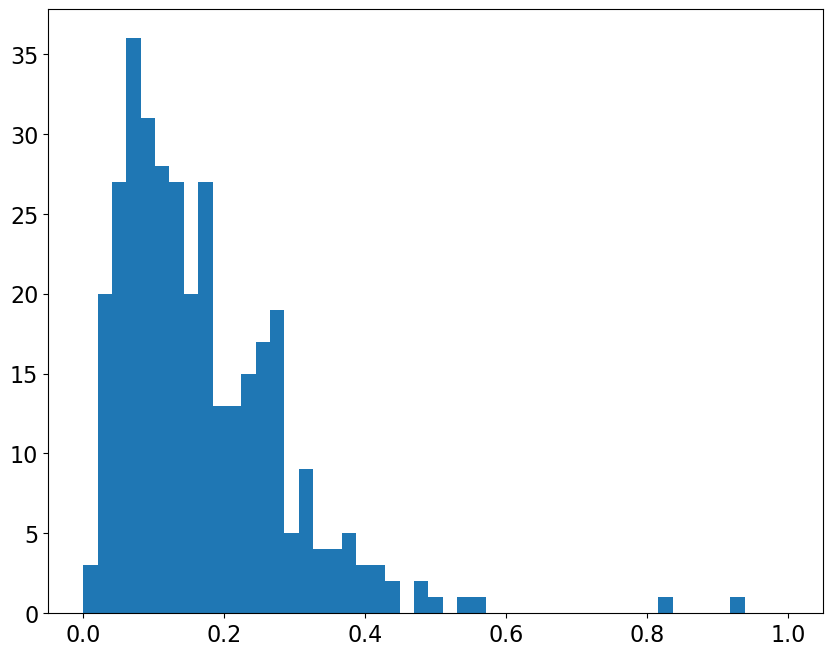

In [18]:
matchidx, sep2d, _ = seltgts.match_to_catalog_sky(skycrd)
pl.hist(sep2d.to(u.arcsec).value, bins=np.linspace(0,1));

In [19]:
mrgtbl = table.hstack([seltbl, basetable[matchidx]])[sep2d < 0.2*u.arcsec]
any_saturated_ = [mrgtbl[x] for x in mrgtbl.colnames if 'near_sat' in x]
any_saturated_mrg = any_saturated_[0]
for row in any_saturated_[1:]:
    print(row.sum())
    any_saturated_mrg = any_saturated_mrg | row
any_saturated_mrg.sum(), len(mrgtbl)

76
28
82
52
190


(211, 231)

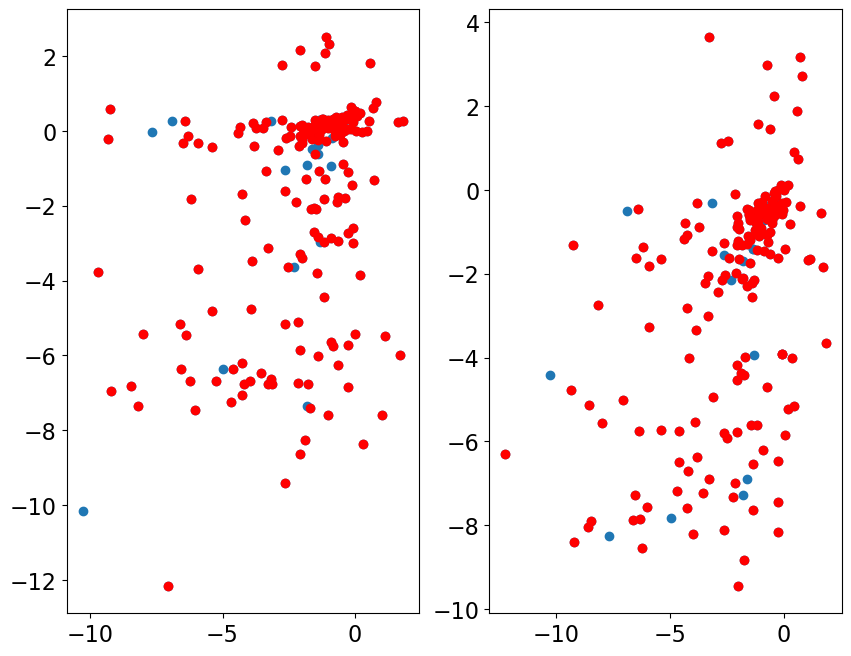

In [20]:
ax1 = pl.subplot(1,2,1)
#ax1.scatter(mrgtbl['ch1_mag'] - mrgtbl['ch2_mag'], mrgtbl['ch3_mag'] - mrgtbl['ch4_mag'])
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f182m']),
            (mrgtbl['mag_ab_f466n'] - mrgtbl['mag_ab_f212n']))
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f182m'])[any_saturated_mrg],
            (mrgtbl['mag_ab_f466n'] - mrgtbl['mag_ab_f212n'])[any_saturated_mrg], color='r')
ax2 = pl.subplot(1,2,2)
#ax1.scatter(mrgtbl['ch1_mag'] - mrgtbl['ch2_mag'], mrgtbl['ch3_mag'] - mrgtbl['ch4_mag'])
ax2.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f182m']),
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f187n']))
ax2.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f182m'])[any_saturated_mrg],
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f187n'])[any_saturated_mrg], color='r')

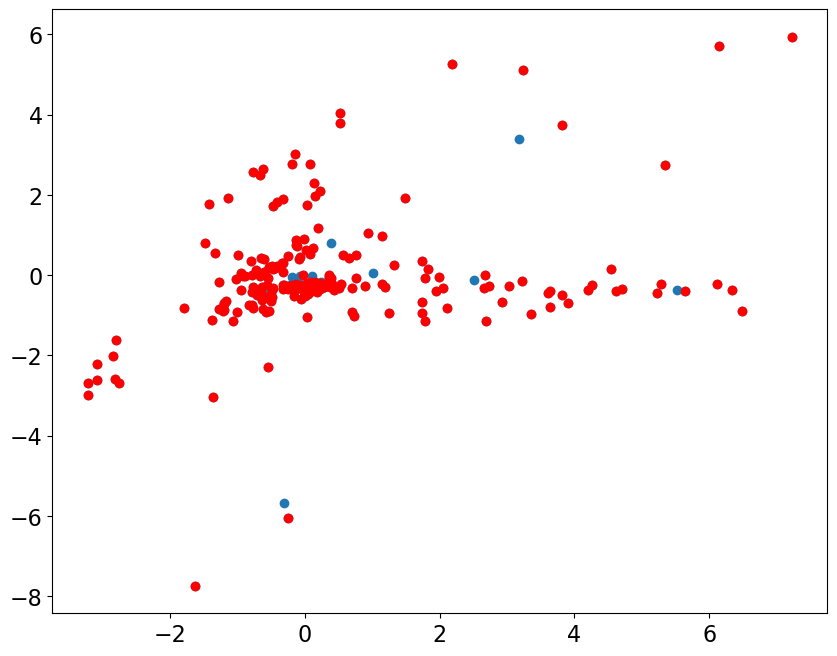

In [21]:
ax1 = pl.subplot(1,1,1)
#ax1.scatter(mrgtbl['ch1_mag'] - mrgtbl['ch2_mag'], mrgtbl['ch3_mag'] - mrgtbl['ch4_mag'])
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n']),
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n']))
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n'])[any_saturated_mrg],
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n'])[any_saturated_mrg], color='r')

In [22]:
mrgtbl

name,ra,dec,glon,glat,rel_flag,ch1_id,ch1_mag,ch1_err,ch1_back,ch1_snr,ch1_cov,ch1_mnr,ch1_flag,priority,x_f410m,y_f410m,flux_f410m,passno_f410m,dx_f410m,dy_f410m,dflux_f410m,qf_f410m,rchi2_f410m,fracflux_f410m,fluxlbs_f410m,dfluxlbs_f410m,fwhm_f410m,spread_model_f410m,dspread_model_f410m,fluxiso_f410m,xiso_f410m,yiso_f410m,sky_f410m,skycoord_f410m,flux_jy_f410m,eflux_jy_f410m,mag_ab_f410m,emag_ab_f410m,near_saturated_f410m_f410m,replaced_saturated_f410m,sep_f212n,id_f212n,x_f212n,y_f212n,flux_f212n,passno_f212n,dx_f212n,dy_f212n,dflux_f212n,qf_f212n,rchi2_f212n,fracflux_f212n,fluxlbs_f212n,dfluxlbs_f212n,fwhm_f212n,spread_model_f212n,dspread_model_f212n,fluxiso_f212n,xiso_f212n,yiso_f212n,sky_f212n,skycoord_f212n,flux_jy_f212n,eflux_jy_f212n,mag_ab_f212n,emag_ab_f212n,near_saturated_f212n_f212n,replaced_saturated_f212n,sep_f466n,id_f466n,x_f466n,y_f466n,flux_f466n,passno_f466n,dx_f466n,dy_f466n,dflux_f466n,qf_f466n,rchi2_f466n,fracflux_f466n,fluxlbs_f466n,dfluxlbs_f466n,fwhm_f466n,spread_model_f466n,dspread_model_f466n,fluxiso_f466n,xiso_f466n,yiso_f466n,sky_f466n,skycoord_f466n,flux_jy_f466n,eflux_jy_f466n,mag_ab_f466n,emag_ab_f466n,near_saturated_f466n_f466n,replaced_saturated_f466n,sep_f405n,id_f405n,x_f405n,y_f405n,flux_f405n,passno_f405n,dx_f405n,dy_f405n,dflux_f405n,qf_f405n,rchi2_f405n,fracflux_f405n,fluxlbs_f405n,dfluxlbs_f405n,fwhm_f405n,spread_model_f405n,dspread_model_f405n,fluxiso_f405n,xiso_f405n,yiso_f405n,sky_f405n,skycoord_f405n,flux_jy_f405n,eflux_jy_f405n,mag_ab_f405n,emag_ab_f405n,near_saturated_f405n_f405n,replaced_saturated_f405n,sep_f187n,id_f187n,x_f187n,y_f187n,flux_f187n,passno_f187n,dx_f187n,dy_f187n,dflux_f187n,qf_f187n,rchi2_f187n,fracflux_f187n,fluxlbs_f187n,dfluxlbs_f187n,fwhm_f187n,spread_model_f187n,dspread_model_f187n,fluxiso_f187n,xiso_f187n,yiso_f187n,sky_f187n,skycoord_f187n,flux_jy_f187n,eflux_jy_f187n,mag_ab_f187n,emag_ab_f187n,near_saturated_f187n_f187n,replaced_saturated_f187n,sep_f182m,id_f182m,x_f182m,y_f182m,flux_f182m,passno_f182m,dx_f182m,dy_f182m,dflux_f182m,qf_f182m,rchi2_f182m,fracflux_f182m,fluxlbs_f182m,dfluxlbs_f182m,fwhm_f182m,spread_model_f182m,dspread_model_f182m,fluxiso_f182m,xiso_f182m,yiso_f182m,sky_f182m,skycoord_f182m,flux_jy_f182m,eflux_jy_f182m,mag_ab_f182m,emag_ab_f182m,near_saturated_f182m_f182m,replaced_saturated_f182m,flux_jy_410m405,mag_ab_410m405,flux_jy_405m410,mag_ab_405m410,flux_jy_182m187,mag_ab_182m187,flux_jy_187m182,mag_ab_187m182
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,deg,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,deg,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,deg,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,deg,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,deg,,,,,,,,,,,,,,,,,,,,,"deg,deg",Jy,Jy,,,,,Jy,,Jy,,Jy,,Jy,
int64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,int64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,SkyCoord,float32,float32,float32,float32,bool,bool,float64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,SkyCoord,float32,float32,float32,float32,bool,bool,float64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,SkyCoord,float32,float32,float32,float32,bool,bool,float64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,SkyCoord,float32,float32,float32,float32,bool,bool,float64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,SkyCoord,float32,float32,float32,float32,bool,bool,float64,int64,float64,float64,float32,float64,float32,float32,float32,float32,float

In [23]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_longwave_RGB_unrotated.png')
img_jw = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_longwave_RGB_unrotated.png'))[::-1,:,:]
wwi_jw_unflip = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))
ww = wwi_jw_unflip
rgb = img_jw

In [24]:
set(tgtlist['priority'])

{1, 5, 10, 20}

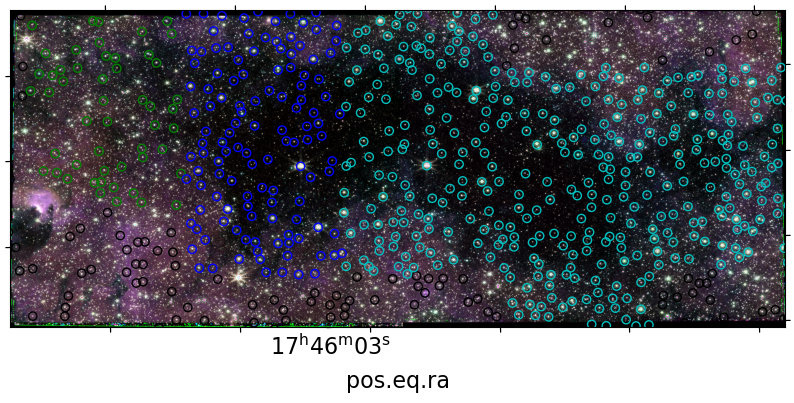

In [25]:
ax = pl.subplot(projection=ww) #.sub([2,1]))
rgb_scaled = rgb
ax.imshow(rgb_scaled)#.swapaxes(0,1))
axlims = ax.axis()
for pri, color in zip((1,5,10,20), ('k', 'g', 'b', 'c')):
    sel = tgtlist['priority'] == pri
    ax.scatter(tgtcrds.ra[sel], tgtcrds.dec[sel], 
               transform=ax.get_transform('icrs'), marker='o', facecolor='none', edgecolor=color)
ax.axis(axlims);

(-0.5, 2328.5, -0.5, 5682.5)

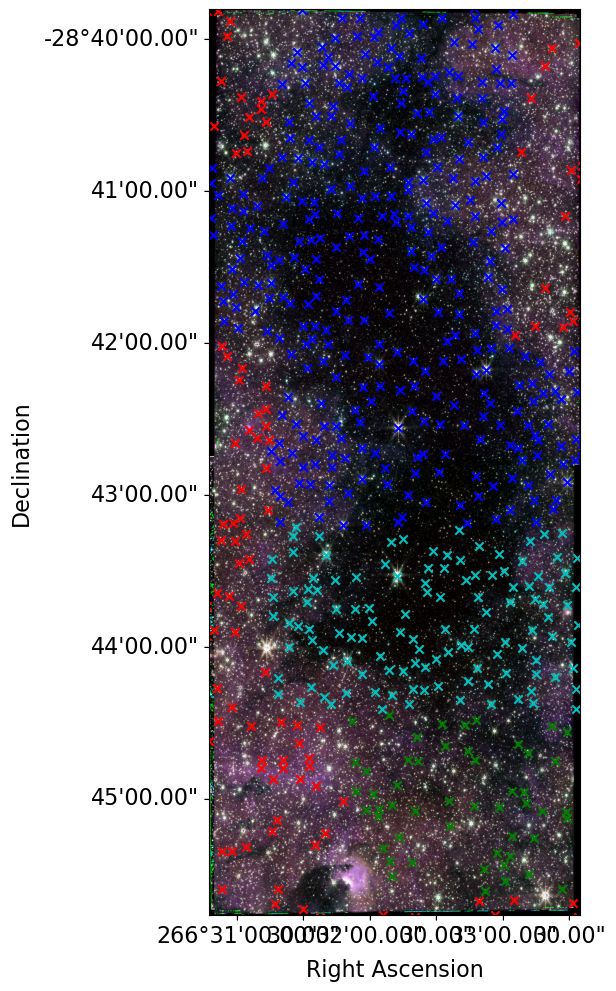

In [26]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_longwave_RGB_unrotated.png')
img_jw = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_longwave_RGB_unrotated.png'))[::-1,:,:]
wwi_jw_unflip = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_jw = img_jw.swapaxes(0,1)
wwi_jw = wwi_jw_unflip.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_jw)
ax.imshow(img_jw)

axlims = ax.axis()

for pri, color in zip((1,5,10,20), ('r', 'g', 'c', 'b')):
    sel = tgtlist['priority'] == pri
    ax.scatter(tgtcrds.dec[sel], tgtcrds.ra[sel], transform=ax.get_transform('world'), marker='x', color=color)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
ax.axis(axlims)

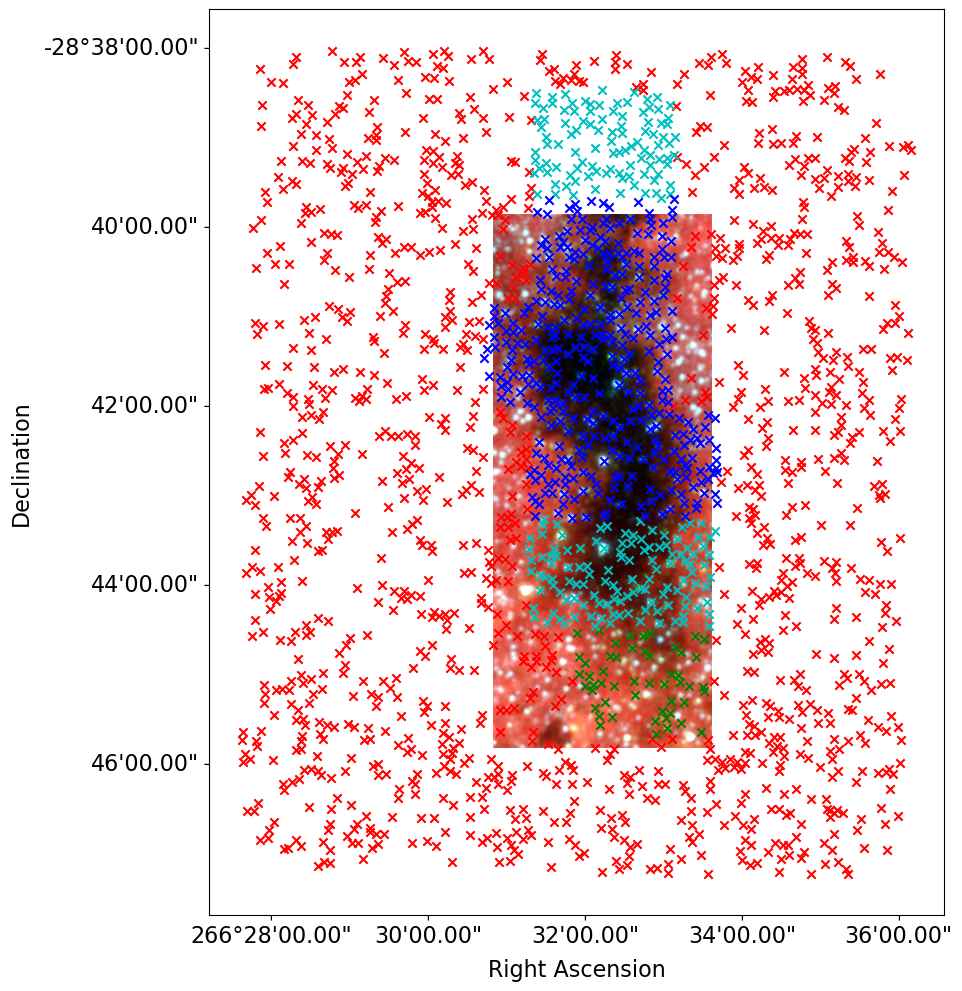

In [27]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickSpitzer_RGB_I421.png')
img_spitzer = np.array(PIL.Image.open(f'{basepath}/images/BrickSpitzer_RGB_I421.png'))[::-1,:,:]
wwi_spitzer_unflip = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_spitzer = img_spitzer.swapaxes(0,1)
wwi_spitzer = wwi_spitzer_unflip.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_spitzer)
ax.imshow(img_spitzer)

#crds = tgtcrds
#ax.scatter(
#    crds.dec,
#    crds.ra,
#    transform=ax.get_transform('world'),
#    marker='x', facecolors=(0.2, 1, 0.6),
#    #markeredgewidth=0.5,
#    # for non-x facecolors='none'
#    #edgecolors=(0.3, 0.5, 0.8), 
#);

for pri, color in zip((1,5,10,20), ('r', 'g', 'c', 'b')):
    sel = tgtlist['priority'] == pri
    ax.scatter(tgtcrds.dec[sel], tgtcrds.ra[sel], transform=ax.get_transform('world'), marker='x', color=color)
#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
#fig.savefig(f"{basepath}/images/BlueStarsWithSpitzerMatches_on_RGB.png", bbox_inches='tight')

# Inset Zooms

In [28]:
import copy

In [29]:
from astropy import units as u
from astropy import coordinates
from astropy.stats import mad_std
from astropy import visualization
from astropy.visualization import simple_norm
import astropy.visualization
import copy
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1 import make_axes_locatable
import radio_beam


def make_scalebar(ax, left_side, length, color='w', linestyle='-', label='',
                  fontsize=12, text_offset=0.1*u.arcsec):
    axlims = ax.axis()
    lines = ax.plot(u.Quantity([left_side.ra, left_side.ra-length]),
                    u.Quantity([left_side.dec]*2),
                    color=color, linestyle=linestyle, marker=None,
                    transform=ax.get_transform('fk5'),
                   )
    txt = ax.text((left_side.ra-length/2).to(u.deg).value,
                  (left_side.dec+text_offset).to(u.deg).value,
                  label,
                  verticalalignment='bottom',
                  horizontalalignment='center',
                  transform=ax.get_transform('fk5'),
                  color=color,
                  fontsize=fontsize,
                 )
    ax.axis(axlims)
    return lines,txt



def make_zoom(filename, zoom_parameters,
              overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
              overview_cmap='gray_r',
              inset_cmap='inferno',
              main_zoombox=None,
              scalebar_loc=(0.1,0.1),
              scalebar_length=0.1*u.pc,
              beam_loc=(0.05, 0.05),
              nsigma_asinh=5,
              nsigma_max=10,
              nticks_inset=7,
              fontsize=20,
              tick_fontsize=16,
              distance=8.5*u.kpc
             ):

    fh = fits.open(filename)
    img = fh[0].data
    ww = WCS(fh[0].header)
    
    # cut out the minimal region that has data in it
    lbx,lby = np.argmax(np.any(notnan, axis=0)), np.argmax(np.any(notnan, axis=1))
    rtx,rty = notnan.shape[1] - np.argmax(np.any(notnan[::-1,::-1], axis=0)), notnan.shape[0] - np.argmax(np.any(notnan[::-1,::-1], axis=1))
    
    img = img[lby:rty, lbx:rtx]
    ww = ww[lby:rty, lbx:rtx]
    
    radesys = ww.wcs.radesys.upper()

    fig = pl.figure(1, figsize=(10,10))
    fig.clf()
    ax = fig.add_subplot(projection=ww.celestial)

    norm = simple_norm(img, **overview_vis_pars)

    img[img==0] = np.nan
    mad = mad_std(img, ignore_nan=True)

    if hasattr(norm.stretch, 'a') and nsigma_asinh is not None:
        norm.vmax = (np.nanmedian(img) + nsigma_max*mad)
        a_point = (np.nanmedian(img) + nsigma_asinh*mad) / norm.vmax
        norm.stretch.a = a_point
        print(f"numbers for norm: {np.nanmedian(img), nsigma_asinh, mad, nsigma_asinh*mad, norm.vmax, a_point}")

    im = ax.imshow(img, cmap=overview_cmap, norm=norm)

    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel(f"RA ({radesys})", fontsize=fontsize)
    dec.set_axislabel(f"Dec ({radesys})", fontsize=fontsize, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)


    for zp in zoom_parameters:

        xl,xr = zp['xl'], zp['xr']
        yl,yu = zp['yl'], zp['yu']
        slc = [slice(yl,yu), slice(xl,xr)]
        axins = inset_axes(ax, **zp['inset_pars'],
                           axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                           axes_kwargs=dict(wcs=ww.celestial))

        norm2 = simple_norm(img, **zp['vis_pars'])

        inset_cm = copy.copy(pl.cm.get_cmap(inset_cmap))
        inset_cm.set_bad(inset_cm(0))

        im_ins = axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap=inset_cm, norm=norm2)
        mark_inset(parent_axes=ax, inset_axes=axins,
                   fc="none", ec="b", **zp['mark_inset_pars'])
        ra = axins.coords['ra']
        dec = axins.coords['dec']
        axins.set_xticklabels([])
        axins.set_yticklabels([])
        axins.xaxis.set_visible(False)
        axins.yaxis.set_visible(False)
        ra.set_ticks_visible(False)
        dec.set_ticks_visible(False)
        ra.set_axislabel('')
        dec.set_axislabel('')
        ra.ticklabels.set_visible(False)
        dec.ticklabels.set_visible(False)

        caxins = inset_axes(axins,
                 width="5%", # width = 10% of parent_bbox width
                 height="100%", # height : 50%
                 loc='lower left',
                 bbox_to_anchor=(1.05, 0., 1, 1),
                 bbox_transform=axins.transAxes,
                 borderpad=0,
                 )

        cbins = pl.colorbar(mappable=im_ins, cax=caxins)
        cbins.ax.tick_params(labelsize=tick_fontsize)
        cbins.set_label(f"S$_\\nu$ [Jy beam$^{-1}$]", fontsize=fontsize)

        if 'tick_locs' in zp:
            cbins.set_ticks(zp['tick_locs'])
            if 'tick_labels' in zp:
                cbins.set_ticklabels(zp['tick_labels'])
        elif 'asinh' in str(norm2.stretch).lower():
            rounded_loc, rounded = determine_asinh_ticklocs(norm2.vmin, norm2.vmax, nticks=nticks_inset)
            cbins.set_ticks(rounded_loc)
            cbins.set_ticklabels(rounded)
        elif'log' in str(norm2.stretch).lower():
            if norm2.vmin > 0:
                rounded_loc, rounded = determine_asinh_ticklocs(norm2.vmin, norm2.vmax, nticks=nticks_inset, rms=mad, stretch='log')
                cbins.set_ticks(rounded_loc)
                cbins.set_ticklabels(rounded)
            else:
                ticks = cbins.get_ticks()
                newticks = [norm2.vmin] + list(ticks)
                newticks = [norm2.vmin, 0,] + list(np.geomspace(mad, norm2.vmax, 4))
                print(f"ticks={ticks}, newticks={newticks}, mad={mad}, vmin={norm2.vmin}")
                cbins.set_ticks(newticks)

    if main_zoombox:
        ax.axis(main_zoombox)

    divider = make_axes_locatable(ax)
    cax1 = fig.add_axes([ax.get_position().x1+0.01,
                         ax.get_position().y0,
                         0.02,
                         ax.get_position().height])
    cb1 = pl.colorbar(mappable=im, cax=cax1)
    cb1.ax.tick_params(labelsize=tick_fontsize)
    cb1.set_label(f"S$_\\nu$ [Jy beam$^{-1}$]", fontsize=fontsize)
    pl.setp(cb1.ax.yaxis.get_label(), backgroundcolor="white")

    left_side = coordinates.SkyCoord(*ww.celestial.wcs_pix2world(scalebar_loc[1]*img.shape[1],
                                                                        scalebar_loc[0]*img.shape[0], 0)*u.deg, frame='fk5')
    length = (scalebar_length / distance).to(u.arcsec, u.dimensionless_angles())
    make_scalebar(ax, left_side, length, color='k', linestyle='-', label=f'{scalebar_length:0.1f}',
                  text_offset=0.5*u.arcsec, fontsize=fontsize)

    beam = radio_beam.Beam.from_fits_header(fh[0].header)
    ell = beam.ellipse_to_plot(beam_loc[1]*img.shape[1], beam_loc[0]*img.shape[0], pixscale=ww.celestial.pixel_scale_matrix[1,1]*u.deg)
    ax.add_patch(ell)

In [30]:
def hide_ticks(ax):
    ra = ax.coords['ra']
    dec = ax.coords['dec']
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ra.set_ticks_visible(False)
    dec.set_ticks_visible(False)
    ra.set_axislabel('')
    dec.set_axislabel('')
    ra.ticklabels.set_visible(False)
    dec.ticklabels.set_visible(False)

In [31]:
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector
from matplotlib.transforms import Bbox

def mark_inset_otherdata(axins, parent_ax, bl, tr, loc1, loc2, edgecolor='b', flip=False):
    if 'GLON' in parent_ax.wcs.axis_type_names:
        blt = bl.transform_to('galactic')
        trt = tr.transform_to('galactic')
        (rx1,ry1),(rx2,ry2) = (parent_ax.wcs.wcs_world2pix([[blt.l.deg,
                                                             blt.b.deg]],0)[0],
                               parent_ax.wcs.wcs_world2pix([[trt.l.deg,
                                                             trt.b.deg]],0)[0]
                              )
    else:
        blt = bl.transform_to(parent_ax.wcs.wcs.radesys.lower())
        trt = tr.transform_to(parent_ax.wcs.wcs.radesys.lower())
        if flip:
            de,ra = blt.ra.deg, blt.dec.deg
            d2,r2 = trt.ra.deg, trt.dec.deg
        else:
            ra,de = blt.ra.deg, blt.dec.deg
            r2,d2 = trt.ra.deg, trt.dec.deg
        (rx1,ry1),(rx2,ry2) = (parent_ax.wcs.wcs_world2pix([[ra,
                                                             de]],0)[0],
                               parent_ax.wcs.wcs_world2pix([[r2,
                                                             d2]],0)[0]
                              )
    #if flip:
    #    rx1,ry1 = ry1,rx1
    #    rx2,ry2 = ry2,rx2
    bbox = Bbox(np.array([(rx1,ry1),(rx2,ry2)]))
    rect = TransformedBbox(bbox, parent_ax.transData)

    markinkwargs = dict(fc='none', ec=edgecolor)

    pp = BboxPatch(rect, fill=False, **markinkwargs)
    parent_ax.add_patch(pp)

    p1 = BboxConnector(axins.bbox, rect, loc1=loc1, **markinkwargs)
    axins.add_patch(p1)
    p1.set_clip_on(False)
    p2 = BboxConnector(axins.bbox, rect, loc1=loc2, **markinkwargs)
    axins.add_patch(p2)
    p2.set_clip_on(False)

    return bbox, rect, p1, p2, pp

In [32]:
wwflip = ww#.sub([2,1])

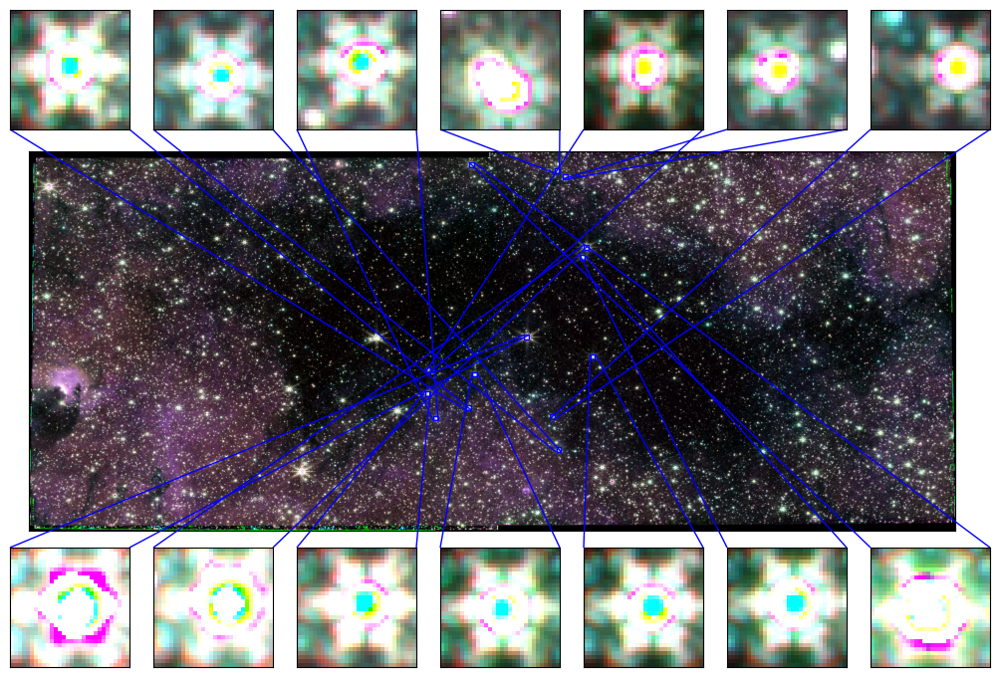

In [33]:
tick_fontsize = 14
fontsize = 16

rgb_scaled = rgb

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwflip)
im = ax.imshow(rgb_scaled)

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")

distance = 8.5*u.kpc
scalebar_length = 0.1*u.pc
scalebar_loc=(0.14,0.15) # y, x

ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

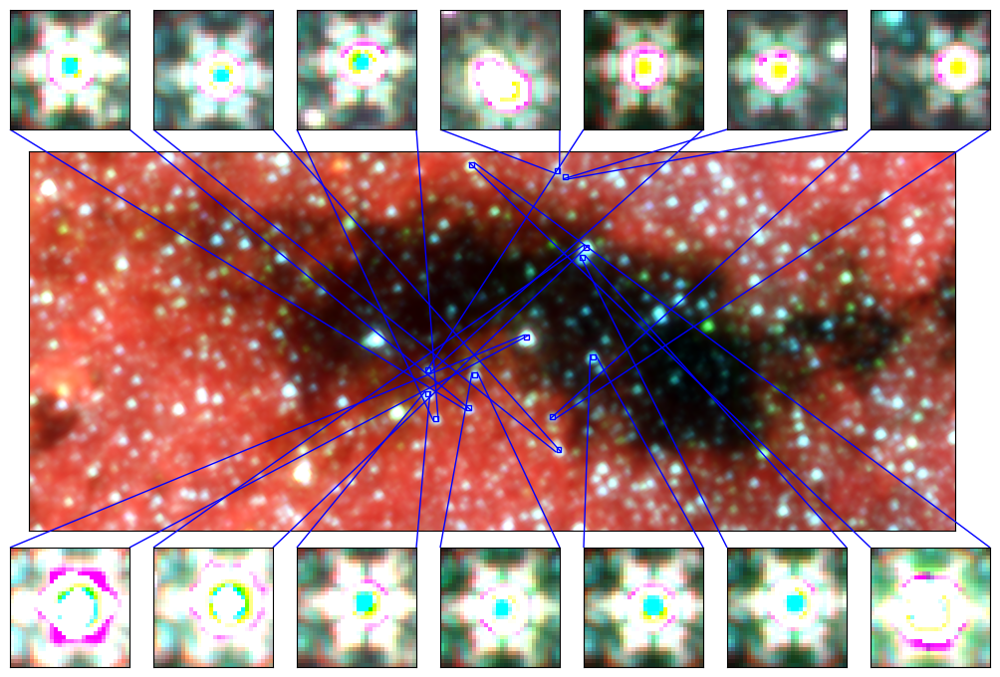

In [34]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_spitzer_unflip)
im = ax.imshow(img_spitzer.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

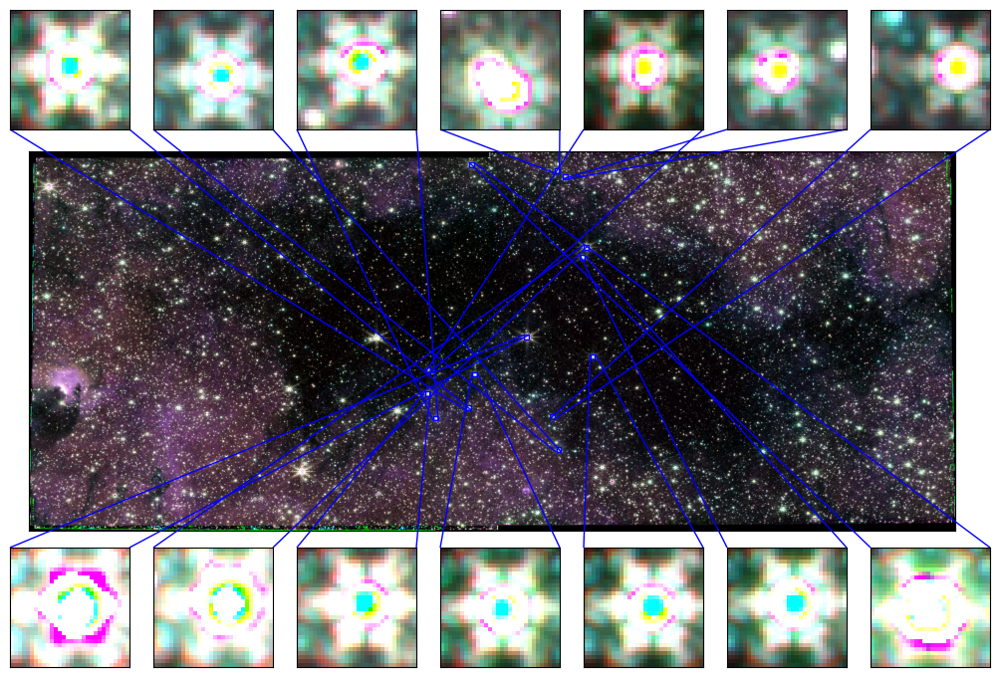

In [35]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jw_unflip)
im = ax.imshow(img_jw.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

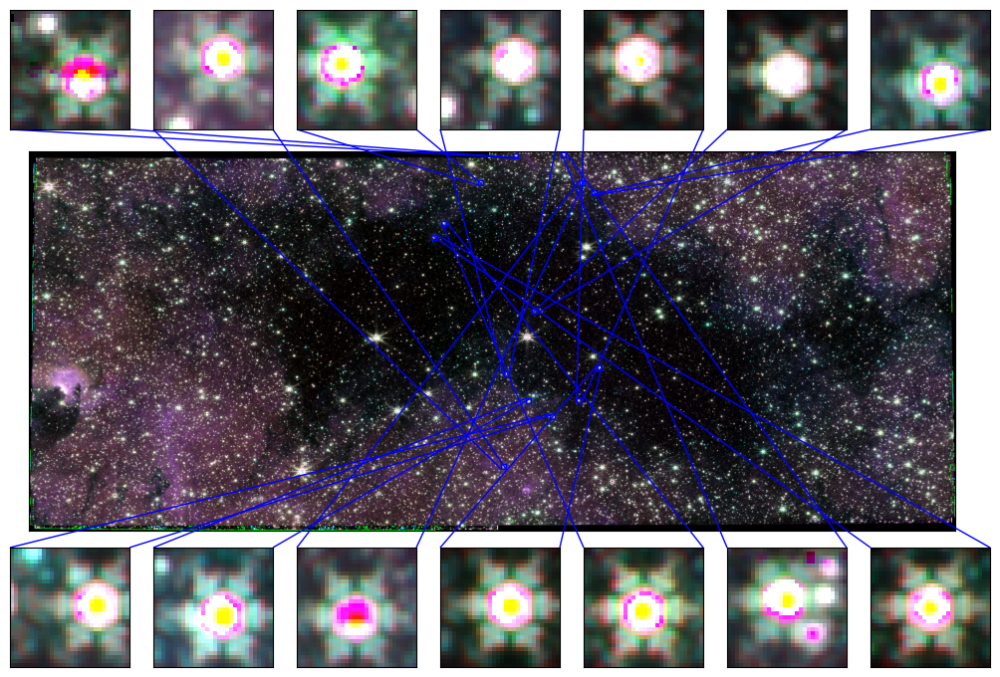

In [36]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jw_unflip)
im = ax.imshow(img_jw.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20][14:]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

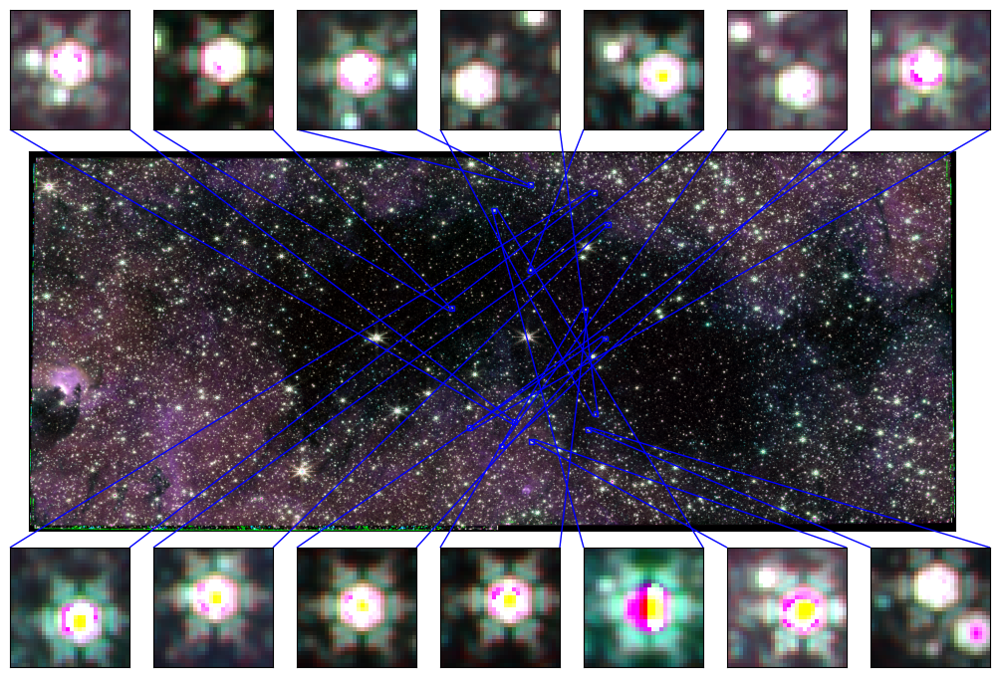

In [37]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jw_unflip)
im = ax.imshow(img_jw.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20][28:]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

(-0.5, 2328.5, -0.5, 5682.5)

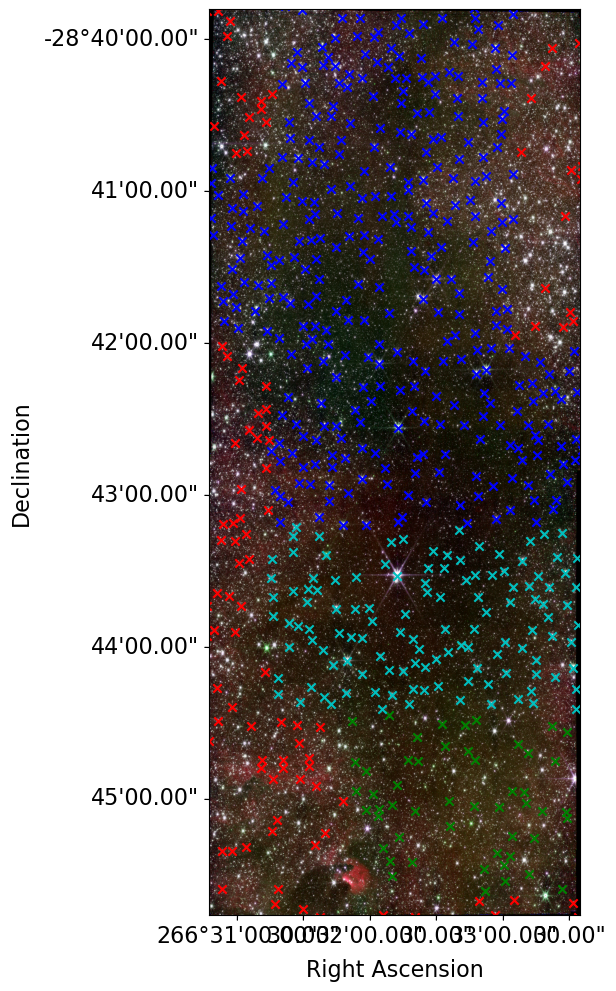

In [38]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_shortwave_RGB_187_212_182.png')
img_jwshort = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_shortwave_RGB_187_212_182.png'))[::-1,:,:]
wwi_jwshort_unflip = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_jwshort = img_jwshort.swapaxes(0,1)
wwi_jwshort = wwi_jwshort_unflip.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_jwshort)
ax.imshow(img_jwshort)

axlims = ax.axis()

for pri, color in zip((1,5,10,20), ('r', 'g', 'c', 'b')):
    sel = tgtlist['priority'] == pri
    ax.scatter(tgtcrds.dec[sel], tgtcrds.ra[sel], transform=ax.get_transform('world'), marker='x', color=color)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
ax.axis(axlims)

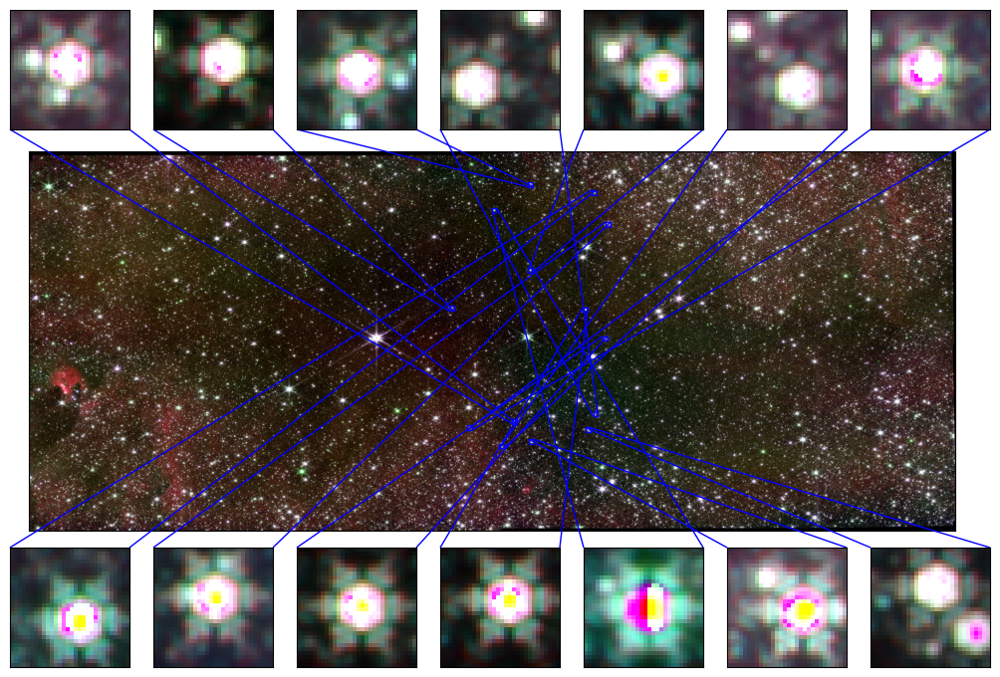

In [39]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jwshort_unflip)
im = ax.imshow(img_jwshort.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(tgtcrds[tgtlist['priority'] == 20][28:]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

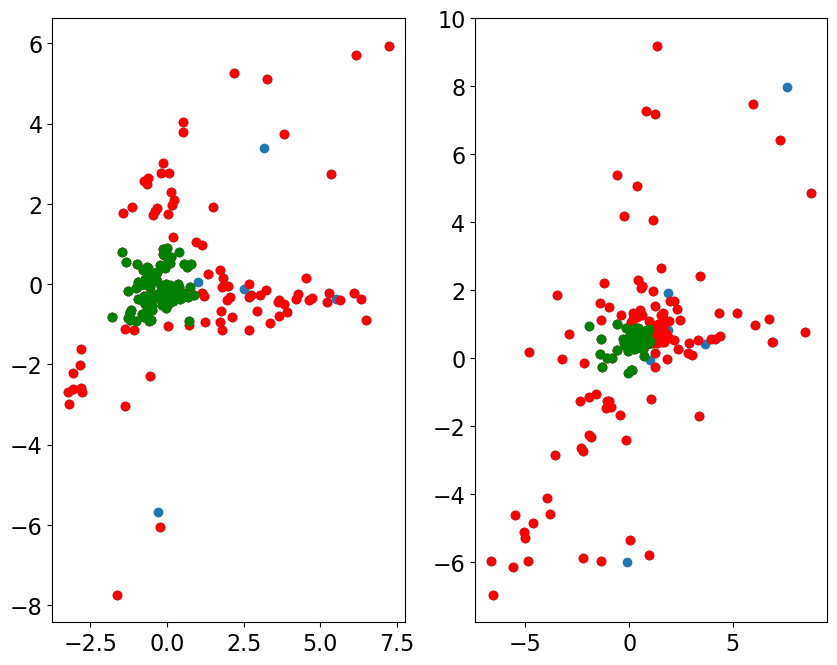

In [40]:
ax1 = pl.subplot(1,2,1)
#ax1.scatter(mrgtbl['ch1_mag'] - mrgtbl['ch2_mag'], mrgtbl['ch3_mag'] - mrgtbl['ch4_mag'])
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n']),
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n']))
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n'])[any_saturated_mrg],
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n'])[any_saturated_mrg], color='r')
c1 = (mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n'])
c2 = (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n'])
magsel = (c1 < 1) & (c1 > -2) & (c2 < 1) & (c2 > -1)
ax1.scatter((mrgtbl['mag_ab_f410m'] - mrgtbl['mag_ab_f466n'])[magsel],
            (mrgtbl['mag_ab_f405n'] - mrgtbl['mag_ab_f466n'])[magsel], color='g')
ax2 = pl.subplot(1,2,2)
#ax1.scatter(mrgtbl['ch1_mag'] - mrgtbl['ch2_mag'], mrgtbl['ch3_mag'] - mrgtbl['ch4_mag'])
ax2.scatter((mrgtbl['mag_ab_f182m'] - mrgtbl['mag_ab_f212n']),
            (mrgtbl['mag_ab_f187n'] - mrgtbl['mag_ab_f212n']))
ax2.scatter((mrgtbl['mag_ab_f182m'] - mrgtbl['mag_ab_f212n'])[any_saturated_mrg],
            (mrgtbl['mag_ab_f187n'] - mrgtbl['mag_ab_f212n'])[any_saturated_mrg], color='r')
c3 = (mrgtbl['mag_ab_f182m'] - mrgtbl['mag_ab_f212n'])
c4 = (mrgtbl['mag_ab_f187n'] - mrgtbl['mag_ab_f212n'])
magsel2 = (c3 < 1) & (c3 > -2) & (c4 < 1) & (c4 > -1)
ax2.scatter((mrgtbl['mag_ab_f182m'] - mrgtbl['mag_ab_f212n'])[magsel2],
            (mrgtbl['mag_ab_f187n'] - mrgtbl['mag_ab_f212n'])[magsel2], color='g')
#ax2.axis([-2,2,-2,2]);

In [41]:
magsel.data

array([ True, False,  True, False, False,  True,  True,  True, False,
        True,  True,  True, False,  True,  True,  True, False, False,
       False, False,  True, False,  True, False, False, False, False,
        True, False,  True,  True,  True, False, False,  True, False,
        True,  True,  True, False,  True,  True,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
       False,  True, False,  True, False,  True, False,  True, False,
        True, False,  True,  True,  True,  True,  True, False, False,
        True,  True, False,  True,  True,  True, False,  True,  True,
        True,  True,  True, False, False, False, False,  True, False,
        True, False,  True,  True, False,  True, False,  True, False,
       False,  True,  True, False,  True, False, False, False,  True,
        True, False,

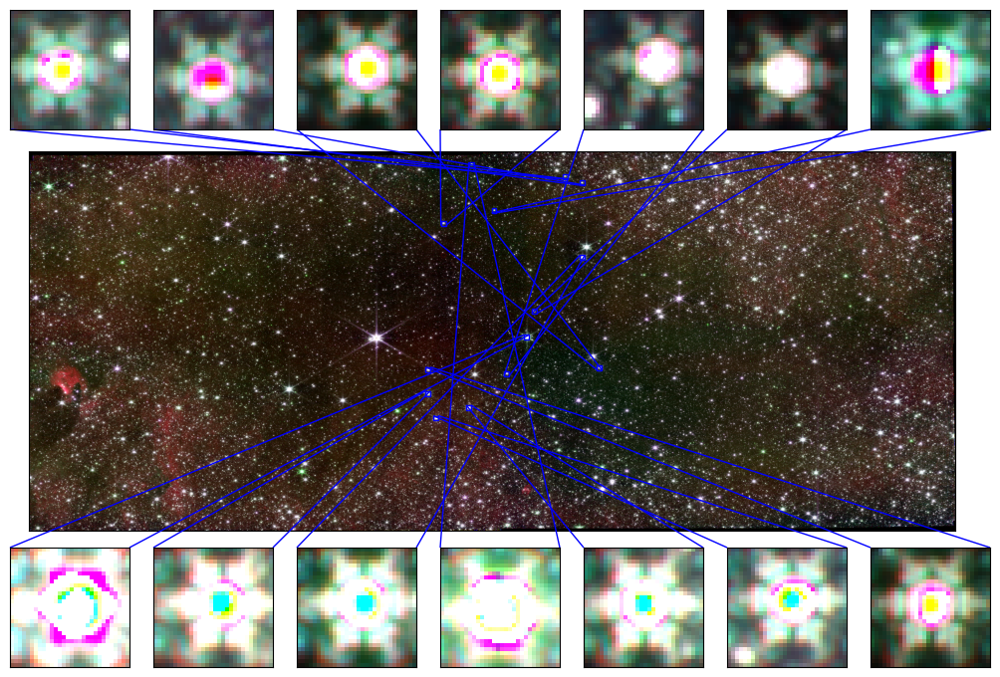

In [42]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jwshort_unflip)
im = ax.imshow(img_jwshort.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(seltgts[sep2d < 0.2*u.arcsec][magsel]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

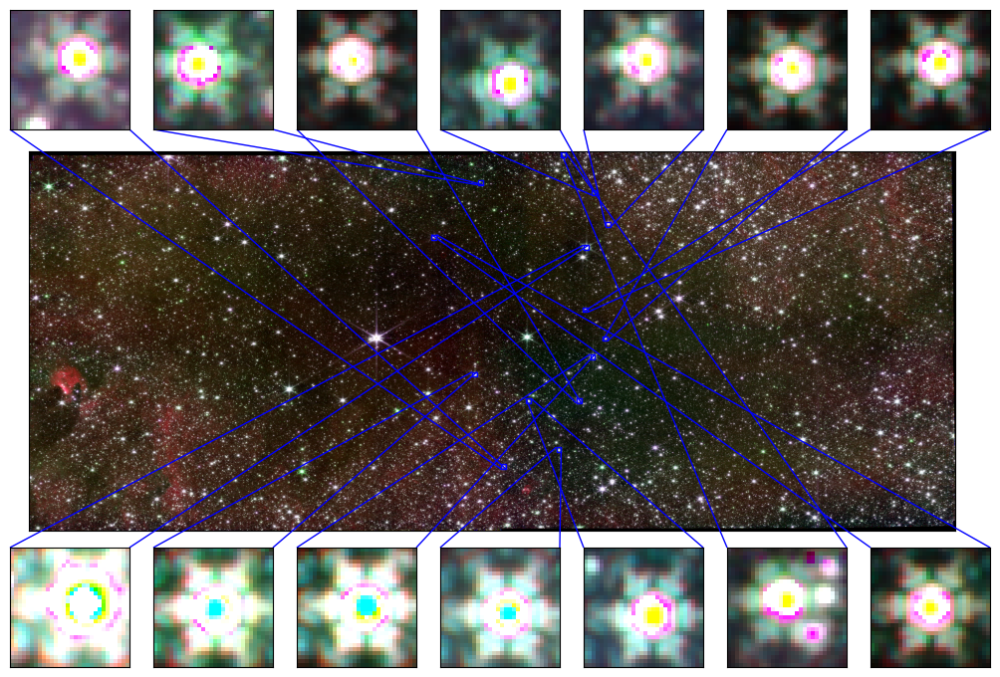

In [43]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jwshort_unflip)
im = ax.imshow(img_jwshort.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(seltgts[sep2d < 0.2*u.arcsec][~magsel]):

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(rgb_scaled[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

In [44]:
import sys, imp
sys.path.append(f'{basepath}/analysis/')
sys.path.append(f'{basepath}/reduction/')
import plot_tools
imp.reload(plot_tools)
filternames = ['f410m', 'f212n', 'f466n', 'f405n', 'f187n', 'f182m']
distance_modulus = dm = 5*np.log10(8.3*u.kpc / (10*u.pc))

In [45]:
any_saturated_ = [basetable[x] for x in basetable.colnames if 'near_sat' in x]
any_saturated = any_saturated_[0]
for row in any_saturated_[1:]:
    any_saturated = any_saturated | row
any_saturated.sum()

8579

In [46]:
basetable['replaced_saturated_f410m'][0]

False

In [47]:
near_sat = [basetable[f'skycoord_{x}']
            .match_to_catalog_sky(basetable[f'skycoord_{x}'][basetable[f'replaced_saturated_{x}'] | basetable[f'near_saturated_{x}_{x}']])[1] < 1.5*u.arcsec
           for x in filternames]
near_saturated = np.any(near_sat, axis=0)
near_saturated.sum()

45891

In [48]:
near_star = [basetable[f'skycoord_{x}']
            .match_to_catalog_sky(basetable[f'skycoord_{x}'], nthneighbor=2)[1] < 0.3*u.arcsec
           for x in filternames]
near_star = np.any(near_star, axis=0)
near_star.sum()

107461

In [50]:
#sel = reg.contains(basetable['skycoord_f410m'], ww)
sel = basetable['sep_f466n'].quantity < 0.05*u.arcsec
sel &= basetable['sep_f405n'].quantity < 0.05*u.arcsec
sel &= basetable['sep_f212n'].quantity < 0.05*u.arcsec
oksep = np.logical_or.reduce([basetable[f'sep_{filtername}'] for filtername in filternames[1:]])
highmagerr = np.any([basetable[f'emag_ab_{filtn}'] > 0.05 for filtn in filternames], axis=0)


def ccds_withiso(basetable=basetable, sel=sel, exclude=any_saturated | ~oksep | highmagerr, **kwargs):
    return plot_tools.ccds_withiso(basetable=basetable, sel=sel, exclude=exclude, **kwargs)

def cmds_withiso(basetable=basetable, sel=sel,
                 exclude=any_saturated | ~oksep | highmagerr, distance_modulus=distance_modulus, **kwargs):
    return plot_tools.cmds_withiso(basetable=basetable, sel=sel, exclude=exclude, distance_modulus=distance_modulus, **kwargs)

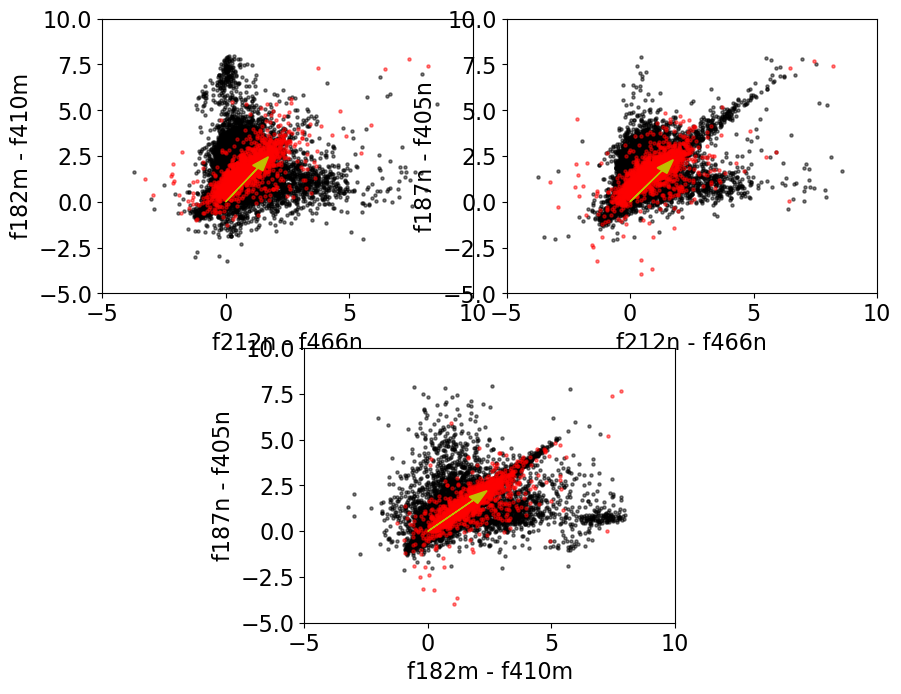

<Figure size 1000x800 with 0 Axes>

In [51]:
ccds_withiso(colors=[('f212n', 'f466n'), ('f182m', 'f410m'), ('f187n', 'f405n'), ] , iso=False);

In [52]:
import regions
reg = regions.Regions.read(f'{basepath}/regions/dark_innerbrick_polygon.reg')[0]
reg2 = regions.Regions.read(f'{basepath}/regions/brick_polygon.reg')[0]

In [53]:
extincted = ((basetable['mag_ab_f182m'] - basetable['mag_ab_f410m'] > 2.)&
             #(basetable['mag_ab_f187n'] - basetable['mag_ab_f405n'] > 1.25)&
             #(basetable['mag_ab_f212n'] - basetable['mag_ab_f466n'] > 1.25)&
             #(basetable['mag_ab_f182m'] < 25) &
             ~any_saturated &
             ~near_saturated &
             ~highmagerr &
             ~near_star
            )

darkzone = reg.contains(basetable['skycoord_f410m'], ww)
brickzone = reg2.contains(basetable['skycoord_f410m'], ww)
extincted.sum(), (darkzone & extincted).sum(), (brickzone & extincted).sum()

(1928, 162, 558)

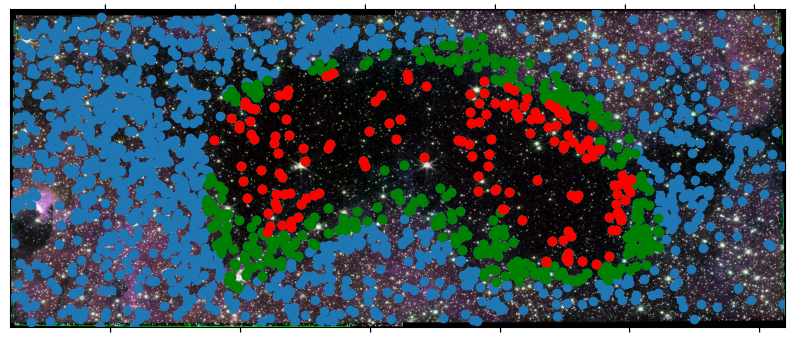

In [54]:
ax = pl.subplot(projection=ww) #.sub([2,1]))
rgb_scaled = rgb
ax.imshow(rgb_scaled)#.swapaxes(0,1))
axlims = ax.axis()
crds = basetable['skycoord_f182m']
ax.scatter(crds[extincted].ra, crds[extincted].dec, transform=ax.get_transform('world'))
ax.scatter(crds[brickzone & extincted].ra, crds[brickzone & extincted].dec, transform=ax.get_transform('world'), color='g')
ax.scatter(crds[darkzone & extincted].ra, crds[darkzone & extincted].dec, transform=ax.get_transform('world'), color='r')
ax.axis(axlims);
ra = ax.coords['ra']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

In [55]:
tbtb = basetable[extincted]['skycoord_f182m', 'mag_ab_f182m', 'emag_ab_f182m', 'mag_ab_f410m', 'emag_ab_f410m',]
tbtb['priority'] = extincted[extincted]*darkzone[extincted] * 30 + extincted[extincted]*brickzone[extincted] * 10 + extincted[extincted]*~(brickzone|darkzone)[extincted]*1
tbtb.write(f"{basepath}/catalogs/red_f182m_f410m_NIRSPEC_selection.csv", overwrite=True)

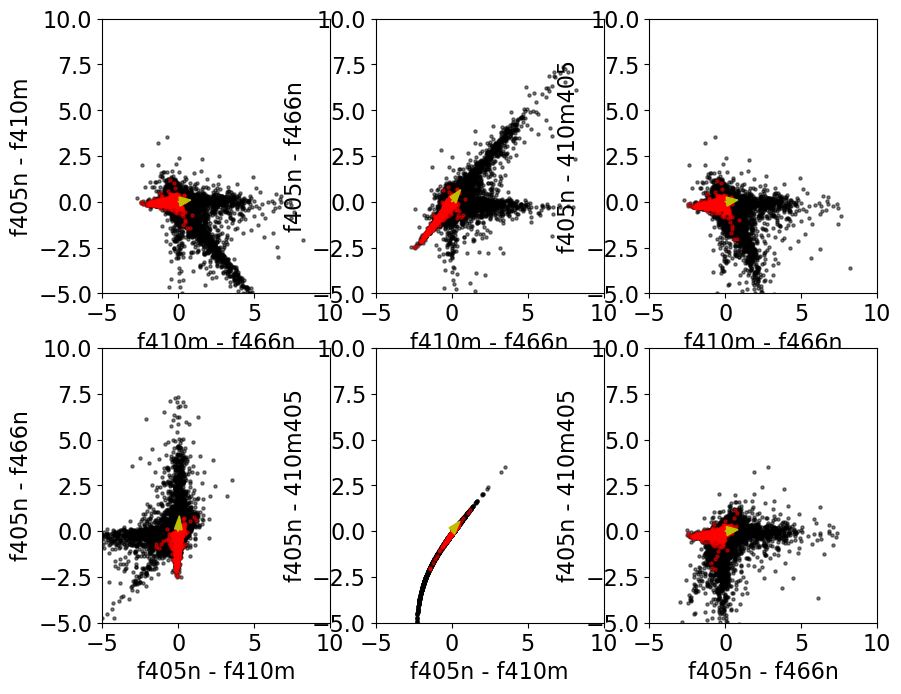

<Figure size 1000x800 with 0 Axes>

In [56]:
ccds_withiso(sel=extincted, iso=False);

In [57]:
# Goal is to find F410M with F182M nondetections
# There must be some, but for some reason they are not turning up
sel410 = ((basetable['mag_ab_f410m'] < 27) &
          ((basetable['skycoord_f410m'].match_to_catalog_sky(basetable['skycoord_f182m'])[1] > 0.2*u.arcsec) |
           (basetable['eflux_jy_f182m'] * 2 > basetable['flux_jy_f182m'])
          )&
             ~any_saturated &
             ~near_saturated &
             ~highmagerr #&
             #~near_star
            )
sel410.sum(), (sel410&darkzone).sum()

(29, 10)

In [58]:
tbtb = basetable[extincted]['skycoord_f410m', 'skycoord_f182m', 'mag_ab_f182m', 'mag_ab_f410m']
tbtb.write(f"{basepath}/catalogs/f410m_without_f182m_NIRSPEC_selection.csv", overwrite=True)

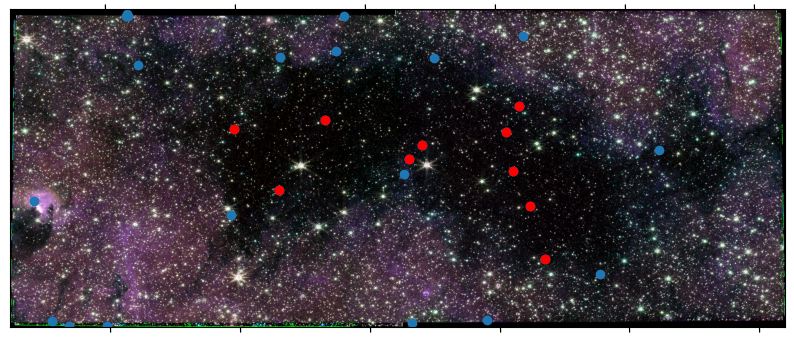

In [59]:
ax = pl.subplot(projection=ww) #.sub([2,1]))
rgb_scaled = rgb
ax.imshow(rgb_scaled)#.swapaxes(0,1))
axlims = ax.axis()
crds = basetable['skycoord_f410m']
ax.scatter(crds[sel410].ra, crds[sel410].dec, transform=ax.get_transform('world'))
ax.scatter(crds[darkzone&sel410].ra, crds[darkzone&sel410].dec, transform=ax.get_transform('world'), color='r')
ax.axis(axlims);
ra = ax.coords['ra']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


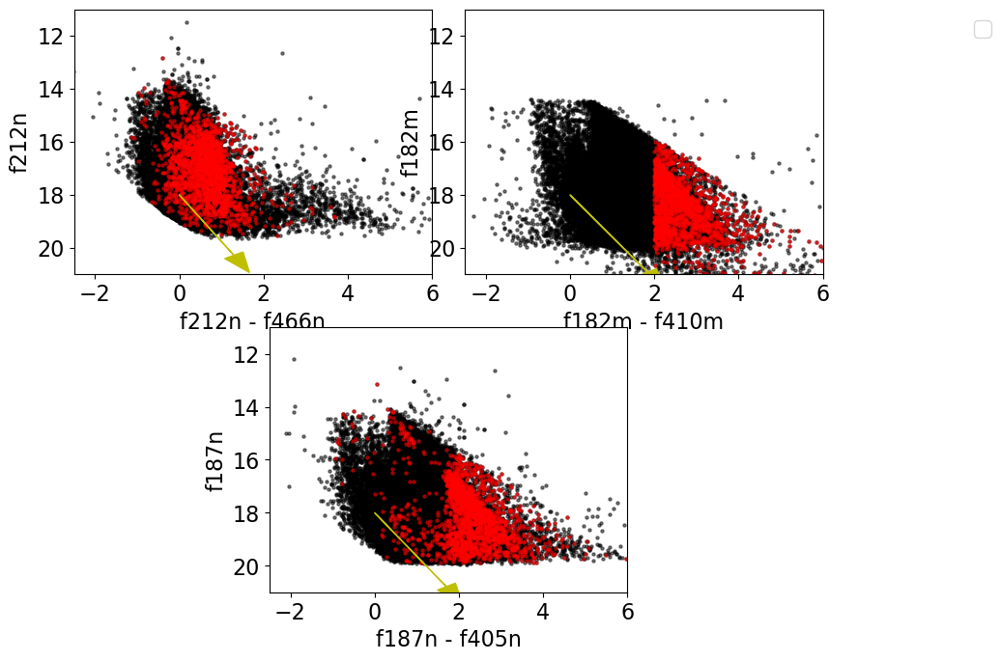

<Figure size 1000x800 with 0 Axes>

In [60]:
cmds_withiso(sel=extincted,
             colors=[('f212n', 'f466n'), ('f182m', 'f410m'), ('f187n', 'f405n'), ], 
             iso=False, axlims=(-2.5,6,21,11));

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


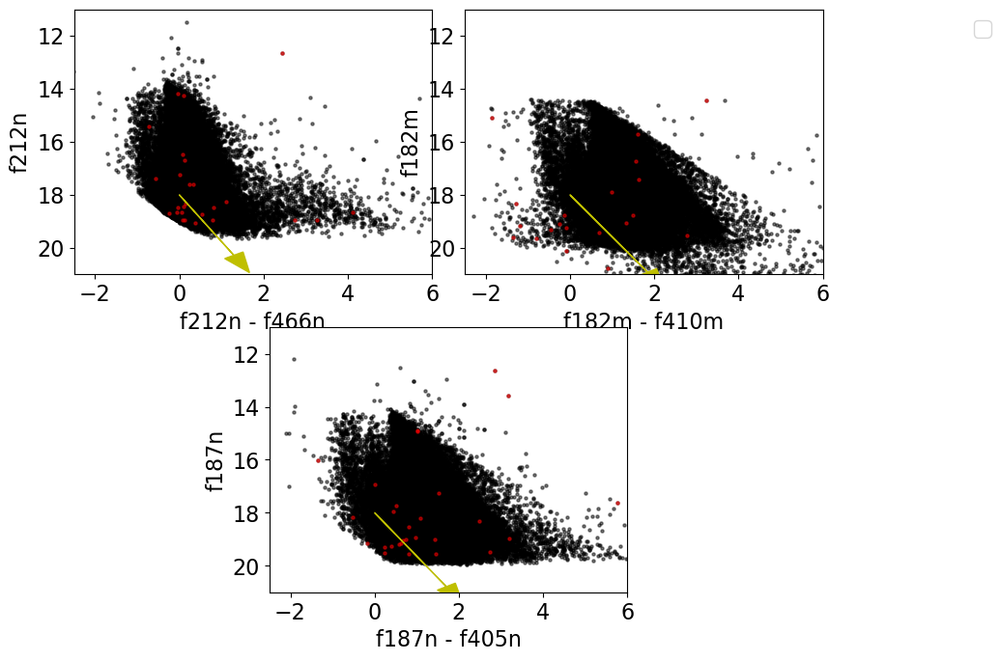

<Figure size 1000x800 with 0 Axes>

In [61]:
cmds_withiso(sel=sel410,
             colors=[('f212n', 'f466n'), ('f182m', 'f410m'), ('f187n', 'f405n'), ], 
             iso=False, axlims=(-2.5,6,21,11));

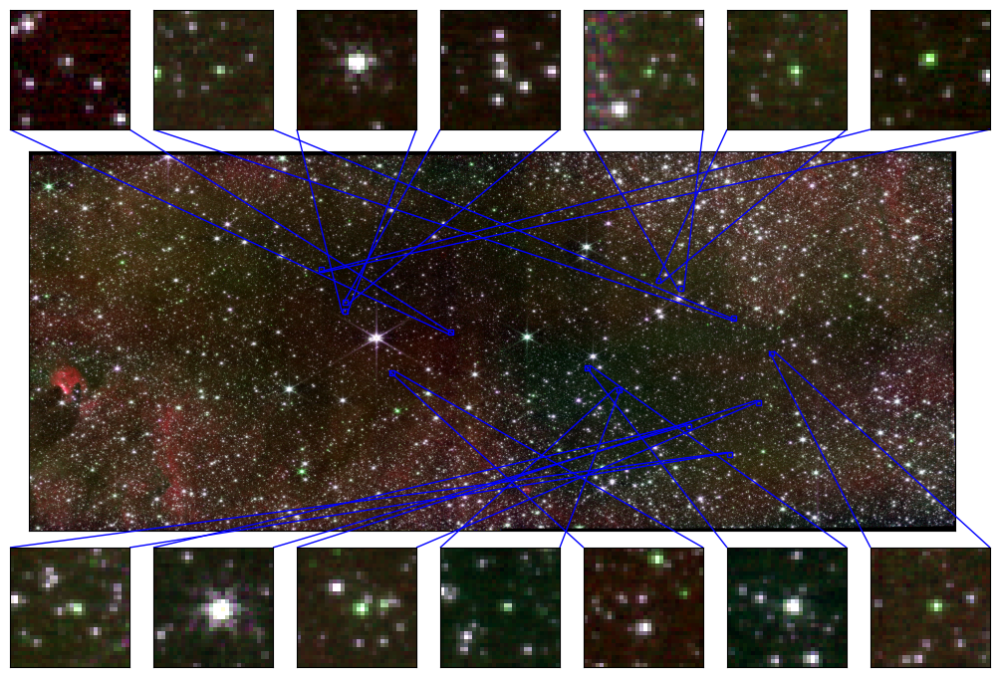

In [62]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jwshort_unflip)
im = ax.imshow(img_jwshort.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(basetable['skycoord_f212n'][extincted&darkzone][::10]):
    

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(img_jwshort.swapaxes(0,1)[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

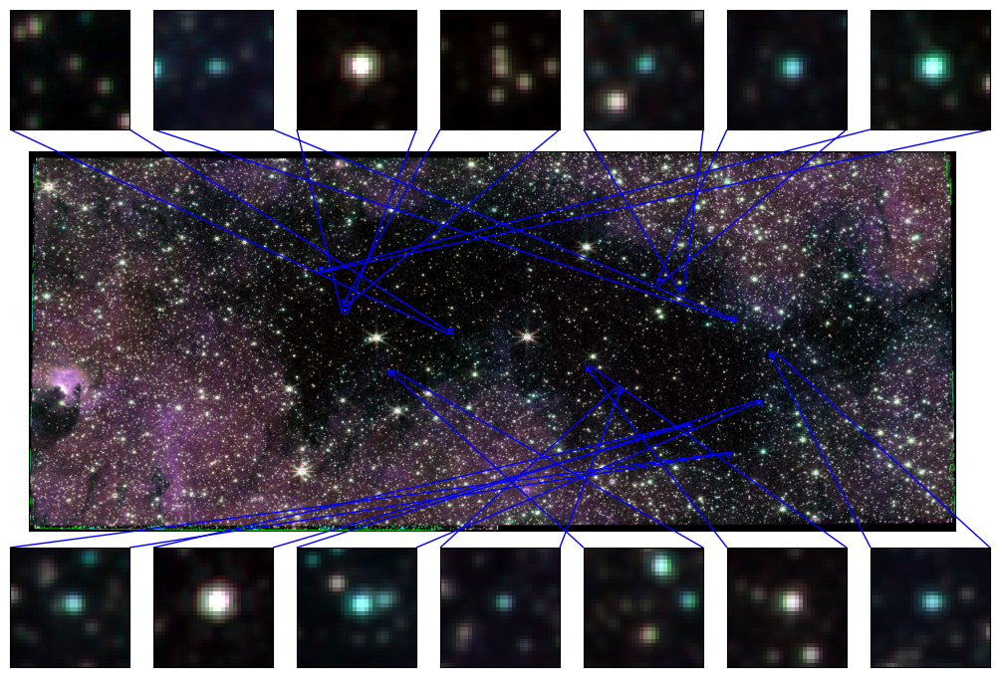

In [63]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jw_unflip)
im = ax.imshow(img_jw.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(basetable['skycoord_f410m'][extincted&darkzone][::10]):
    
    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(img_jw.swapaxes(0,1)[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

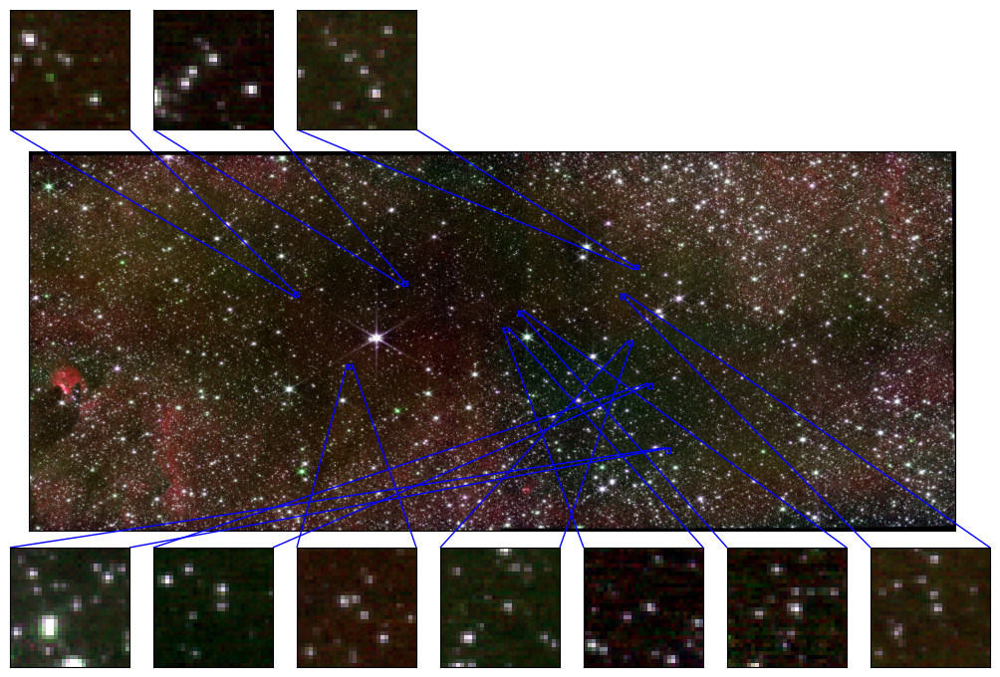

In [64]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jwshort_unflip)
im = ax.imshow(img_jwshort.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(basetable['skycoord_f212n'][sel410&darkzone]):
    

    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(img_jwshort.swapaxes(0,1)[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break

In [ ]:
tick_fontsize = 14
fontsize = 16

fig = pl.figure(figsize=(12,12))
ax = fig.add_subplot(projection=wwi_jw_unflip)
im = ax.imshow(img_jw.swapaxes(0,1))

#ax.axis([167,1617,210,1618])
radesys = ww.wcs.radesys
_ = ax.set_xlabel(f"")
_ = ax.set_ylabel(f"")


ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("")#f"?? RA ({radesys})", fontsize=fontsize)
dec.set_axislabel("")#f"?? Dec ({radesys})", fontsize=fontsize, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticklabel(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticklabel(exclude_overlapping=True)
#dec.set_ticks(number=0)
#ra.set_ticks(number=0)
dec.set_ticks_visible(False)
dec.set_ticklabel_visible(False)
ra.set_ticks_visible(False)
ra.set_ticklabel_visible(False)

ii = 0
for jj, star in enumerate(basetable['skycoord_f410m'][sel410&darkzone]):
    
    xc,yc = wwflip.world_to_pixel(star)
    xl,xr = map(int, (xc - 15, xc + 15))
    yl,yr = map(int, (yc - 15, yc + 15))
    #print(xc,yc,xl,xr,yl,yr)
    if xl > 0 and yl > 0 and yc < rgb_scaled.shape[0] and xc < rgb_scaled.shape[1]:

        nr = 7
        axins = inset_axes(ax,
                           loc=3, width=1.2, height=1.2,
                           axes_class=visualization.wcsaxes.core.WCSAxes,
                            bbox_to_anchor=(0.10 + 0.120 * (ii % nr),
                                            0.22 + 0.450 * (ii // nr),
                                            1,1),
                            bbox_transform=fig.transFigure,                    
                           axes_kwargs=dict(wcs=wwflip))
        bl = coordinates.SkyCoord(*wwflip.wcs_pix2world(xl, yl, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        tr = coordinates.SkyCoord(*wwflip.wcs_pix2world(xr, yr, 0), frame=wwflip.wcs.radesys.lower(), unit=(u.deg,u.deg))
        #print(bl, tr)
        axins.imshow(img_jw.swapaxes(0,1)[yl:yr, xl:xr, :], extent=[xl,xr,yl,yr], )
        if ii < nr:
            mark_inset_otherdata(axins, ax, bl, tr, 1, 2, flip=False)
        else:
            mark_inset_otherdata(axins, ax, bl, tr, 3, 4, flip=False)
        hide_ticks(axins)
        ii += 1
    if ii >= 14:
        break